<span style="background-color: cyan; color: red; font-size: 25px; font-weight: bold">Kernel kept crashing so the last few cells remained without output</span>




In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Subset
from tabulate import tabulate
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import mutual_info_score
from sklearn.decomposition import PCA
from PIL import Image


In [2]:
# Define image transformations
transform = transforms.Compose([
    # transforms.CenterCrop(178),  # Crop the central part of the image
    transforms.Resize((64,64)),       # Resize to 64x64 for faster training
    transforms.ToTensor(),       # Convert image to PyTorch tensor
    transforms.Normalize((0.5,), (0.5,))  # Normalize images to [-1, 1]
])

data_dir = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba'
attributes_path = '/kaggle/input/celeba-dataset/list_attr_celeba.csv'


attributes_df = pd.read_csv(attributes_path)
attributes_df.set_index('image_id', inplace=True)  # Set the image names as the index


# Attribute names (columns of the DataFrame)
attribute_names = attributes_df.columns.tolist()

print("Length:", len(attribute_names))
print(attribute_names)

Length: 40
['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


In [3]:
# Define a custom dataset to load images and their attributes
class CelebADataset(Dataset):
    def __init__(self, root_dir, attributes_df, transform=None):
        self.root_dir = root_dir
        self.attributes_df = attributes_df
        self.transform = transform
        self.image_files = attributes_df.index.tolist()  # Get image names from the DataFrame
        
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        
        # Load image
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        
        # Get attributes for the image
        attributes = self.attributes_df.loc[img_name].values.astype(np.float32)
        
        return image, attributes

# Create a DataLoader
celeba_dataset = CelebADataset(root_dir=data_dir, attributes_df=attributes_df, transform=transform)

# Determine the number of samples to keep (20% of the dataset)
# total_samples = len(celeba_dataset)
# subset_size = int(total_samples * 0.7)

# # Generate a list of random indices to select 20% of the data
# random_indices = torch.randperm(total_samples).tolist()[:subset_size]

# # Create a subset with the selected indices
# celeba_dataset = Subset(celeba_dataset, random_indices)

# print("Size of dataset:",len(celeba_dataset))

batch_size = 512
data_loader = DataLoader(celeba_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

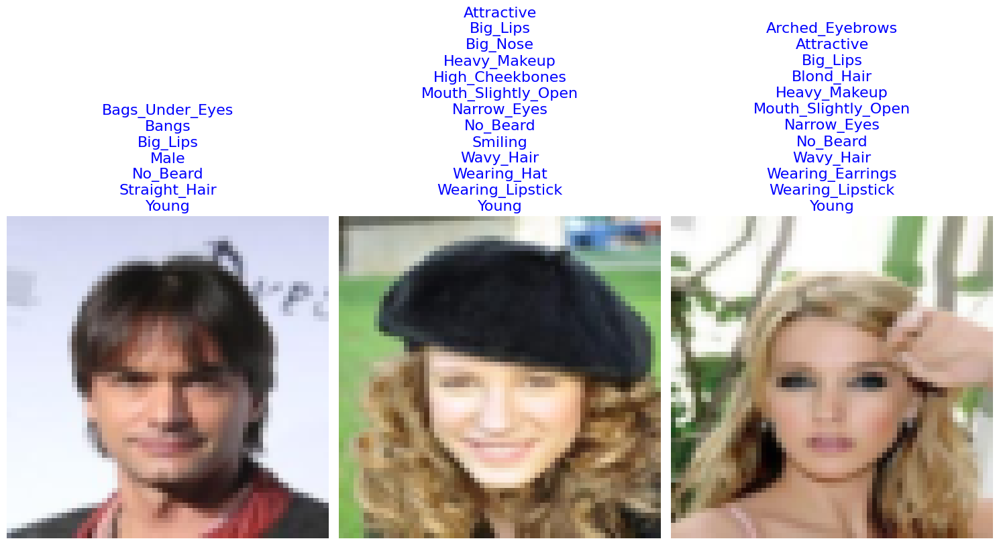

In [4]:
# Display some sample images with their attributes as titles
def show_images_with_attributes(images, attributes, attribute_names, n_images=8):
    import matplotlib.pyplot as plt
    
    # Reduce the number of images to n_images
    images = images[:n_images]
    attributes = attributes[:n_images]
    
    # Plot each image with its attributes as the title
    fig, axes = plt.subplots(1, n_images, figsize=(15, 10))
    for i in range(n_images):
        ax = axes[i]
        img = images[i].permute(1, 2, 0).cpu().numpy()
        img = (img * 0.5 + 0.5).clip(0, 1)  # Denormalize the image
        
        ax.imshow(img)
        ax.axis('off')
        
        # Extract attribute names for active attributes (value = 1)
        active_attrs = [name for name, value in zip(attribute_names, attributes[i]) if value == 1]
        ax.set_title("\n".join(active_attrs), fontsize=16, color="blue", loc='center')
    
    plt.tight_layout()
    plt.show()

# Fetch a batch of data
data_iter = iter(data_loader)
images, attributes = next(data_iter)

# Show images with attributes as titles
show_images_with_attributes(images, attributes, attribute_names, n_images=3)


# Beta VAE
## Encoder

In [5]:
# Define the Encoder network
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(input_dim, 32, kernel_size=4, stride=2, padding=1),  # 64x64 -> 32x32
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 8x8 -> 4x4
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(256 * 4 * 4, latent_dim)
        self.fc_logvar = nn.Linear(256 * 4 * 4, latent_dim)

    def forward(self, x):
        # print("Input Shape: ", x.shape)
        x = self.encoder(x)
        # print("Encoder Shape: ", x.shape)
        x = x.view(x.size(0), -1)  # Flatten
        # print("Flattened Shape: ", x.shape)
        mu = self.fc_mu(x)
        # print("mu Shape: ", mu.shape)
        logvar = self.fc_logvar(x)
        # print("logvar Shape: ", logvar.shape)
        return mu, logvar

## Decoder

In [6]:
class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc = nn.Linear(latent_dim, 256 * 4 * 4)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 4x4 -> 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.ReLU(),
            nn.ConvTranspose2d(32, output_dim, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.Tanh(),  # Output values in range [-1, 1]
        )

    def forward(self, z):
        x = self.fc(z)
        x = x.view(x.size(0), 256, 4, 4)  # Reshape to 4x4x256
        x = self.decoder(x)
        return x


## Together

In [7]:
class BetaVAE(nn.Module):
    def __init__(self, input_dim, latent_dim, beta=1):
        super(BetaVAE, self).__init__()
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = Decoder(latent_dim, input_dim)
        self.beta = beta

    def forward(self, x):
        mu, logvar = self.encoder(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decoder(z)
        return x_recon, mu, logvar

    @staticmethod
    def reparameterize(mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def loss_function(self, recon_x, x, mu, logvar):
        recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum')
        # KL divergence
        kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        # Total loss with β weight
        return recon_loss + self.beta * kld, recon_loss, kld


# Hyperparams

In [8]:
# Hyperparameters
# latent_dim = len(attribute_names) 
latent_dim = 20
beta_values = [0, 1, 5, 10, 50]
# beta_values = [1, 5]
input_dim = 3  
epochs = 5
learning_rate = 5e-5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Using Device: {device}")

Using Device: cuda


In [9]:
data_loader = DataLoader(celeba_dataset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

# Training

In [10]:
from tqdm import tqdm

# Initialize dictionary to store losses for each beta value
beta_losses_per_batch = {beta: {"total": [], "kld": [], "mse": []} for beta in beta_values}
trained_models = {}

# Training Loop
for beta in beta_values:
    print(f"Training β-VAE with β = {beta}")
    model = BetaVAE(input_dim, latent_dim, beta=beta).to(device)
    # model = nn.DataParallel(model)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0
        # Create a tqdm progress bar for the outer loop (epochs)
        with tqdm(enumerate(data_loader), total=len(data_loader), desc=f"Epoch {epoch + 1}/{epochs}") as inner_loop:
            for batch_idx, (x, _) in inner_loop:
                x = x.to(device)
                optimizer.zero_grad()
                x_recon, mu, logvar = model(x)
                # print(x_recon.device)
                # loss, recon_loss, kld = model.module.loss_function(x_recon, x, mu, logvar)
                loss, recon_loss, kld = model.loss_function(x_recon, x, mu, logvar)

                loss.backward()
                train_loss += loss.item()
                optimizer.step()
                
                # Get the batch size
                batch_size = x.size(0)

                # Calculate average loss for the batch
                avg_loss = loss.item() / batch_size
                avg_recon_loss = recon_loss.item() / batch_size
                avg_kld = kld.item() / batch_size

                # Store the average losses for this batch
                beta_losses_per_batch[beta]["total"].append(avg_loss)
                beta_losses_per_batch[beta]["kld"].append(avg_kld)
                beta_losses_per_batch[beta]["mse"].append(avg_recon_loss)

                # Update the progress bar with the current batch's loss
                inner_loop.set_postfix(
                    loss=avg_loss, recon_loss=avg_recon_loss, kld_loss=avg_kld, refresh=True
                )

        # Print the average loss for the epoch
        # train_loss = train_loss / len(data_loader.dataset)
        print(f"Epoch {epoch + 1}/{epochs}, Loss: {train_loss:.4f}")

    # Save example reconstructions after each β-VAE training
    trained_models[beta] = model
    with torch.no_grad():
        x, _ = next(iter(data_loader)) 
        x = x.to(device) 
        x_recon, _, _ = model(x)    
        comparison = torch.cat([x[:16], x_recon[:16]], dim=0)  # Concatenate input and reconstructed images
        save_image(comparison, f"comparison_beta_{beta}.png", normalize=True)


Training β-VAE with β = 0


Epoch 1/5: 100%|██████████| 396/396 [06:10<00:00,  1.07it/s, kld_loss=2.13e+3, loss=1.31e+3, recon_loss=1.31e+3]

Epoch 1/5, Loss: 484636419.5000



Epoch 2/5: 100%|██████████| 396/396 [02:28<00:00,  2.66it/s, kld_loss=1.86e+3, loss=1.08e+3, recon_loss=1.08e+3]

Epoch 2/5, Loss: 234007158.9375



Epoch 3/5: 100%|██████████| 396/396 [02:29<00:00,  2.65it/s, kld_loss=1.73e+3, loss=930, recon_loss=930]        

Epoch 3/5, Loss: 201972511.5625



Epoch 4/5: 100%|██████████| 396/396 [02:31<00:00,  2.62it/s, kld_loss=1.56e+3, loss=912, recon_loss=912]

Epoch 4/5, Loss: 188271090.8438



Epoch 5/5: 100%|██████████| 396/396 [02:28<00:00,  2.66it/s, kld_loss=1.31e+3, loss=910, recon_loss=910]

Epoch 5/5, Loss: 182970611.5625


Training β-VAE with β = 1


Epoch 1/5: 100%|██████████| 396/396 [02:26<00:00,  2.70it/s, kld_loss=65.4, loss=1.3e+3, recon_loss=1.23e+3]  

Epoch 1/5, Loss: 508082579.8125



Epoch 2/5: 100%|██████████| 396/396 [02:25<00:00,  2.72it/s, kld_loss=61.3, loss=1.05e+3, recon_loss=993]    

Epoch 2/5, Loss: 234766808.1875



Epoch 3/5: 100%|██████████| 396/396 [02:28<00:00,  2.67it/s, kld_loss=58.6, loss=970, recon_loss=911]       

Epoch 3/5, Loss: 199886628.0000



Epoch 4/5: 100%|██████████| 396/396 [02:26<00:00,  2.70it/s, kld_loss=58.5, loss=960, recon_loss=901]

Epoch 4/5, Loss: 187806218.9062



Epoch 5/5: 100%|██████████| 396/396 [02:27<00:00,  2.69it/s, kld_loss=57.3, loss=878, recon_loss=821]

Epoch 5/5, Loss: 181646202.5625


Training β-VAE with β = 5


Epoch 1/5: 100%|██████████| 396/396 [02:27<00:00,  2.68it/s, kld_loss=34, loss=1.5e+3, recon_loss=1.33e+3]     

Epoch 1/5, Loss: 542925048.5000



Epoch 2/5: 100%|██████████| 396/396 [02:28<00:00,  2.67it/s, kld_loss=37.1, loss=1.21e+3, recon_loss=1.02e+3]

Epoch 2/5, Loss: 267484314.5312



Epoch 3/5: 100%|██████████| 396/396 [02:28<00:00,  2.67it/s, kld_loss=37.1, loss=1.1e+3, recon_loss=911]     

Epoch 3/5, Loss: 233452894.6875



Epoch 4/5: 100%|██████████| 396/396 [02:26<00:00,  2.70it/s, kld_loss=36.3, loss=1.06e+3, recon_loss=883]

Epoch 4/5, Loss: 221920362.0000



Epoch 5/5: 100%|██████████| 396/396 [02:28<00:00,  2.67it/s, kld_loss=36.2, loss=1.07e+3, recon_loss=885]

Epoch 5/5, Loss: 216716578.4375


Training β-VAE with β = 10


Epoch 1/5: 100%|██████████| 396/396 [02:30<00:00,  2.64it/s, kld_loss=24.1, loss=1.77e+3, recon_loss=1.53e+3] 

Epoch 1/5, Loss: 570807093.1875



Epoch 2/5: 100%|██████████| 396/396 [02:27<00:00,  2.69it/s, kld_loss=25, loss=1.39e+3, recon_loss=1.14e+3]  

Epoch 2/5, Loss: 304728327.8750



Epoch 3/5: 100%|██████████| 396/396 [02:27<00:00,  2.69it/s, kld_loss=27.1, loss=1.25e+3, recon_loss=980]    

Epoch 3/5, Loss: 268367766.6250



Epoch 4/5: 100%|██████████| 396/396 [02:32<00:00,  2.60it/s, kld_loss=27.4, loss=1.3e+3, recon_loss=1.03e+3] 

Epoch 4/5, Loss: 252439998.5000



Epoch 5/5: 100%|██████████| 396/396 [02:28<00:00,  2.67it/s, kld_loss=26.8, loss=1.18e+3, recon_loss=909]

Epoch 5/5, Loss: 245452428.4375


Training β-VAE with β = 50


Epoch 1/5: 100%|██████████| 396/396 [02:27<00:00,  2.68it/s, kld_loss=9.27, loss=2.22e+3, recon_loss=1.76e+3]  

Epoch 1/5, Loss: 627716620.5625



Epoch 2/5: 100%|██████████| 396/396 [02:25<00:00,  2.72it/s, kld_loss=9.55, loss=1.96e+3, recon_loss=1.48e+3]

Epoch 2/5, Loss: 407861312.2500



Epoch 3/5: 100%|██████████| 396/396 [02:25<00:00,  2.72it/s, kld_loss=9.38, loss=1.89e+3, recon_loss=1.42e+3]

Epoch 3/5, Loss: 386165966.1250



Epoch 4/5: 100%|██████████| 396/396 [02:27<00:00,  2.69it/s, kld_loss=9.51, loss=1.89e+3, recon_loss=1.41e+3]

Epoch 4/5, Loss: 378753991.7500



Epoch 5/5: 100%|██████████| 396/396 [02:26<00:00,  2.70it/s, kld_loss=10.8, loss=1.89e+3, recon_loss=1.35e+3]

Epoch 5/5, Loss: 373547928.1250


## Save Trained Weights

In [11]:
# Directory to save models
save_dir = "trained_models"
os.makedirs(save_dir, exist_ok=True)

# Save each trained model
for beta, model in trained_models.items():
    save_path = os.path.join(save_dir, f"beta_vae_beta_{beta}.pt")
    torch.save(model.state_dict(), save_path)
    print(f"Model with β={beta} saved to {save_path}")

Model with β=0 saved to trained_models/beta_vae_beta_0.pt
Model with β=1 saved to trained_models/beta_vae_beta_1.pt
Model with β=5 saved to trained_models/beta_vae_beta_5.pt
Model with β=10 saved to trained_models/beta_vae_beta_10.pt
Model with β=50 saved to trained_models/beta_vae_beta_50.pt


## Load Trained Weights

In [12]:
# Directory where models are saved
save_dir = "trained_models"

# Dictionary to hold loaded models
loaded_models = {}

for beta in beta_values:
    model = BetaVAE(input_dim, latent_dim, beta=beta).to(device)
    save_path = os.path.join(save_dir, f"beta_vae_beta_{beta}.pt")
    model.load_state_dict(torch.load(save_path))
    model.eval()  # Set the model to evaluation mode
    loaded_models[beta] = model
    print(f"Model with β={beta} loaded from {save_path}")


trained_models = loaded_models

Model with β=0 loaded from trained_models/beta_vae_beta_0.pt
Model with β=1 loaded from trained_models/beta_vae_beta_1.pt
Model with β=5 loaded from trained_models/beta_vae_beta_5.pt
Model with β=10 loaded from trained_models/beta_vae_beta_10.pt
Model with β=50 loaded from trained_models/beta_vae_beta_50.pt


/tmp/ipykernel_23/4128224814.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_path))


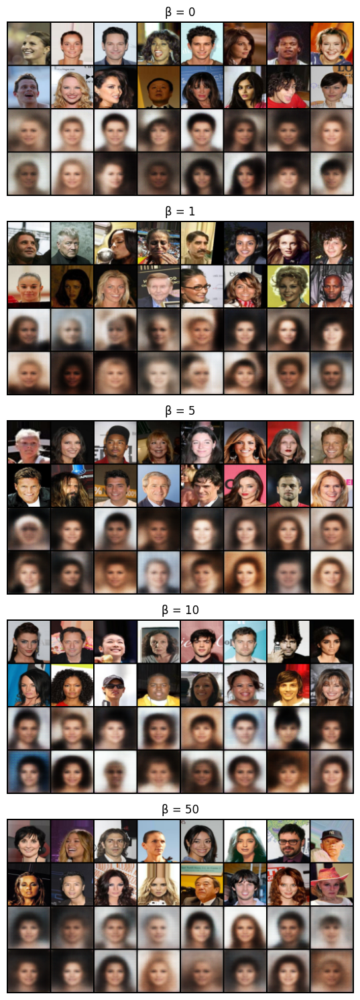

In [13]:
import os

# Specify the directory where the images are saved
image_dir = "./"  # Adjust this if your images are saved in a specific directory

# Get a list of all comparison images saved in the directory
image_files = [f for f in os.listdir(image_dir) if f.startswith('comparison_beta_') and f.endswith('.png')]

# Sort images by the beta value (extract beta value from the filename)
image_files.sort(key=lambda x: float(x.split('_')[-1].split('.')[0]))

# Create a plot with subplots to display the images one by one, vertically stacked
fig, axes = plt.subplots(len(image_files), 1, figsize=(6, len(image_files) * 3))

if len(image_files) == 1:
    # Handle the case where there is only one image
    axes = [axes]

# Loop through the images and display them
for i, img_file in enumerate(image_files):
    img_path = os.path.join(image_dir, img_file)
    img = Image.open(img_path)
    
    axes[i].imshow(img)
    axes[i].axis('off')  # Hide axes for clarity
    axes[i].set_title(f"β = {img_file.split('_')[-1].split('.')[0]}")

plt.tight_layout()
plt.show()

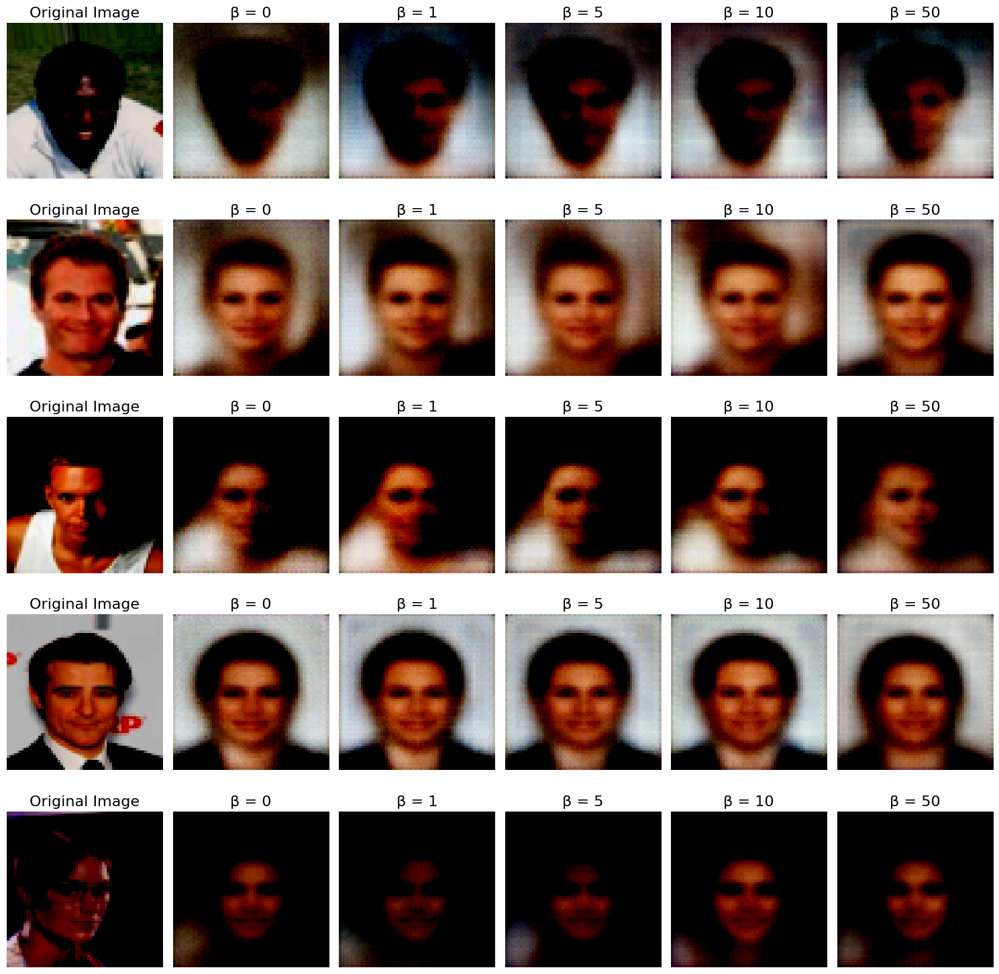

In [14]:
import random
import matplotlib.pyplot as plt
from PIL import Image

# Function to select random images from the data loader
def select_random_images(data_loader, num_images=5):
    random_images = []
    # Pick a random batch of images
    for _ in range(num_images):
        x, _ = next(iter(data_loader))  # Get a random batch
        random_idx = random.randint(0, x.size(0) - 1)  # Pick a random image in the batch
        random_images.append(x[random_idx])
    return random_images

# Select random images from the data loader
random_images = select_random_images(data_loader, num_images=5)

# Create a subplot for the random images and their reconstructions
fig, axes = plt.subplots(len(random_images), len(beta_values) + 1, figsize=(15, len(random_images) * 3))

# Loop through the random images and trained models
for i, img in enumerate(random_images):
    img = img.to(device)
    # Plot the original image
    axes[i, 0].imshow(img.cpu().permute(1, 2, 0))  # Assuming the image has shape [C, H, W]
    axes[i, 0].axis('off')
    axes[i, 0].set_title("Original Image", fontsize=16)  # Larger font for title
    
    # Loop through the models and reconstruct the image
    for j, beta in enumerate(beta_values):
        model = trained_models[beta]
        with torch.no_grad():
            x_recon, _, _ = model(img.unsqueeze(0))  # Add batch dimension
            axes[i, j + 1].imshow(x_recon.cpu().squeeze().permute(1, 2, 0))  # Remove batch dim and permute
            axes[i, j + 1].axis('off')
            axes[i, j + 1].set_title(f"β = {beta}", fontsize=16)  # Larger font for title

plt.tight_layout()
plt.show()


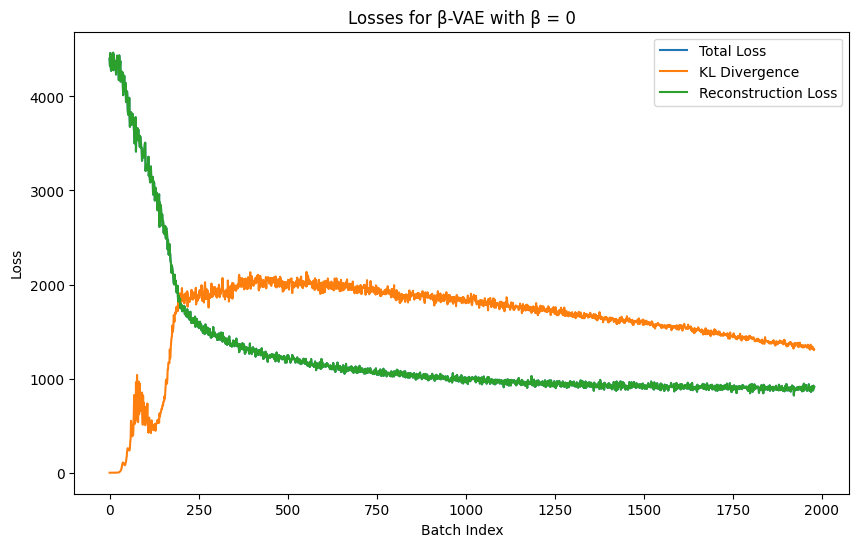

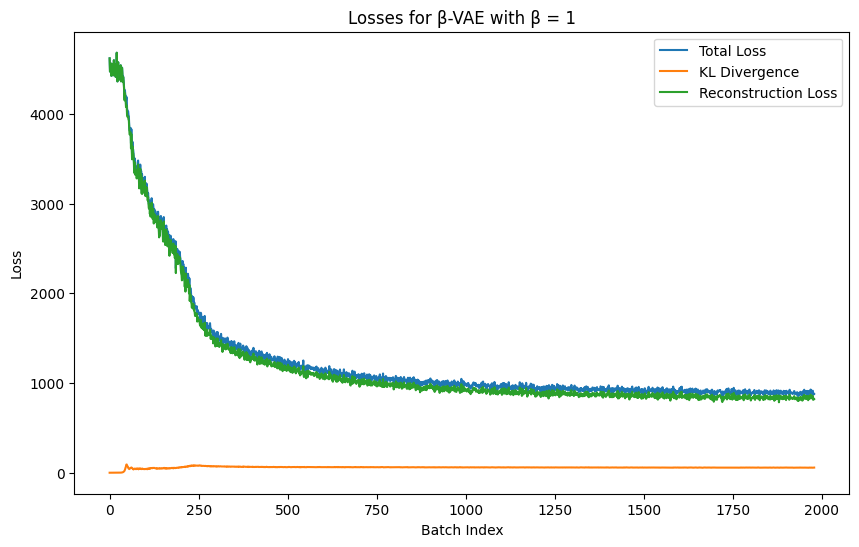

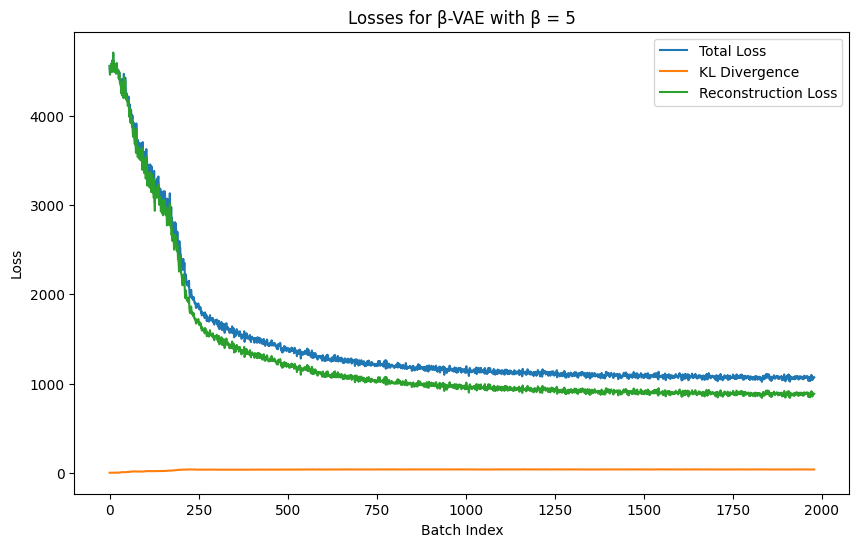

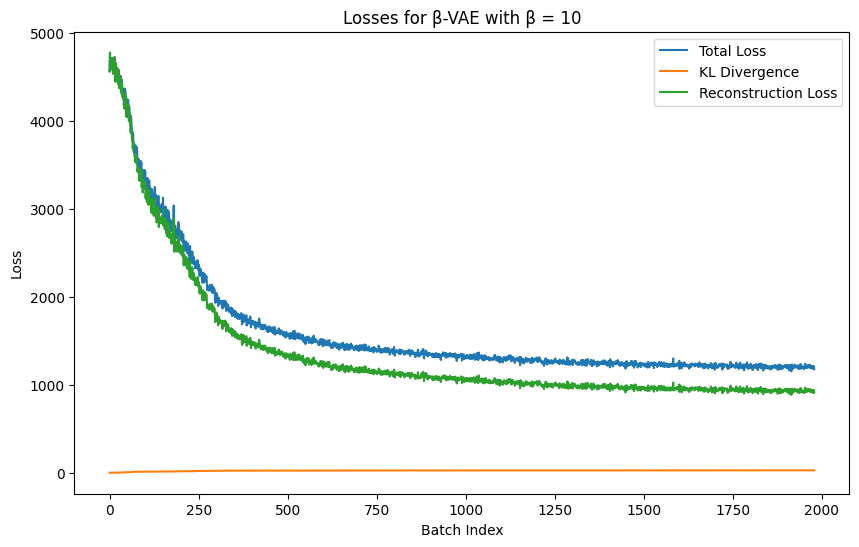

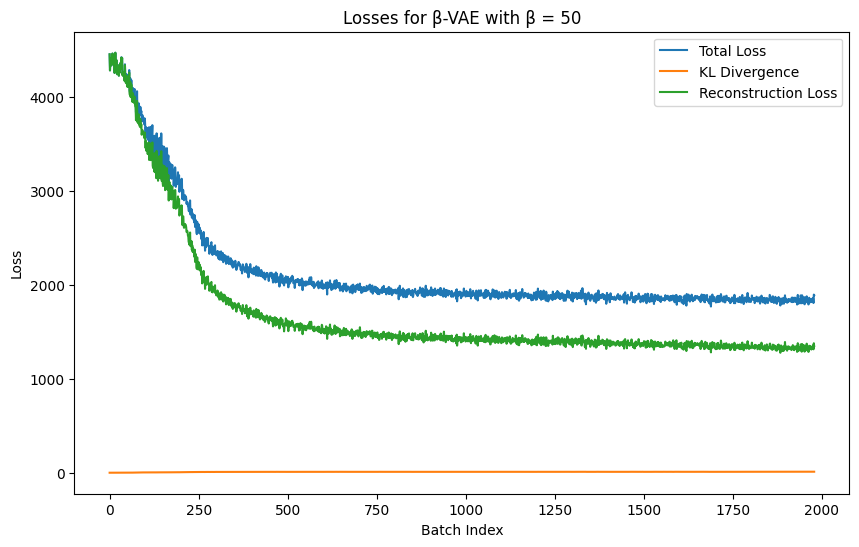

In [15]:
# Plotting the losses after training
for beta in beta_values:
    # Plot the losses for the current beta value
    plt.figure(figsize=(10, 6))
    plt.plot(beta_losses_per_batch[beta]["total"], label='Total Loss')
    plt.plot(beta_losses_per_batch[beta]["kld"], label='KL Divergence')
    plt.plot(beta_losses_per_batch[beta]["mse"], label='Reconstruction Loss')
    plt.title(f'Losses for β-VAE with β = {beta}')
    plt.xlabel('Batch Index')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

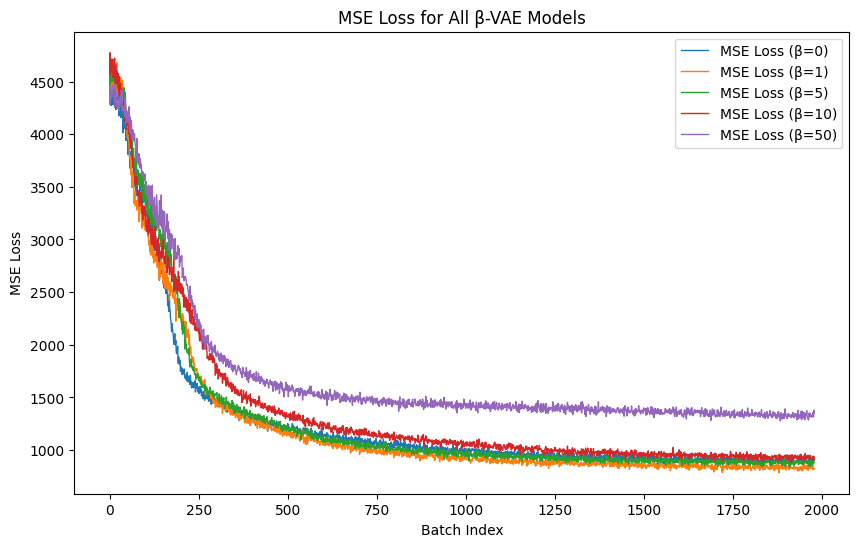

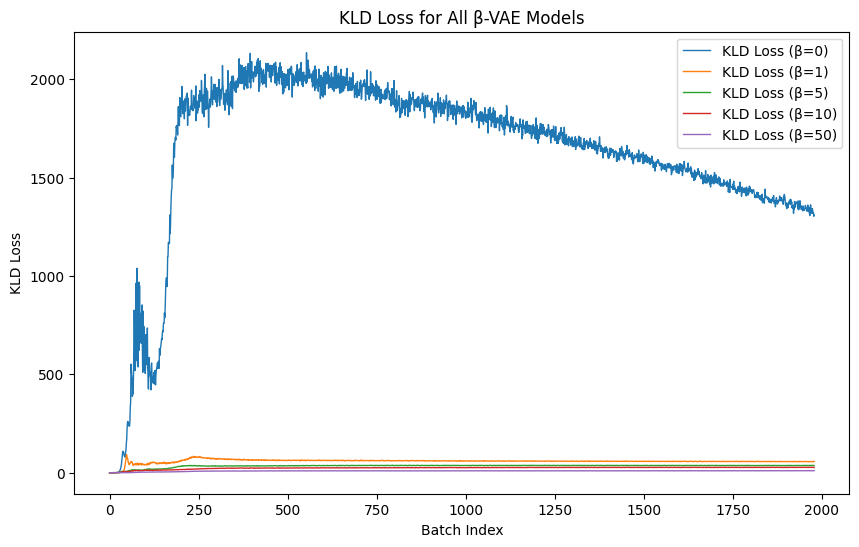

In [16]:
# List to store the MSE and KLD losses for all beta values
mse_losses_all_betas = {beta: [] for beta in beta_values}
kld_losses_all_betas = {beta: [] for beta in beta_values}

# Collect MSE and KLD losses for each batch and beta
for beta in beta_values:
    mse_losses_all_betas[beta] = beta_losses_per_batch[beta]["mse"]
    kld_losses_all_betas[beta] = beta_losses_per_batch[beta]["kld"]

# Plot MSE losses for all beta values
plt.figure(figsize=(10, 6))
for beta in beta_values:
    plt.plot(mse_losses_all_betas[beta], label=f'MSE Loss (β={beta})', linewidth=1.0)  # Reduced line width

plt.title('MSE Loss for All β-VAE Models')
plt.xlabel('Batch Index')
plt.ylabel('MSE Loss')
plt.legend()
plt.show()

# Plot KLD losses for all beta values with reduced line width
plt.figure(figsize=(10, 6))
for beta in beta_values:
    plt.plot(kld_losses_all_betas[beta], label=f'KLD Loss (β={beta})', linewidth=1.0)  # Reduced line width

plt.title('KLD Loss for All β-VAE Models')
plt.xlabel('Batch Index')
plt.ylabel('KLD Loss')
plt.legend()
plt.show()


In [17]:
# Preparing the final losses after 'epoch' epochs
final_losses = []
for beta in beta_values:
    total_loss = beta_losses_per_batch[beta]["total"][-1]  # Last batch's total loss
    kld_loss = beta_losses_per_batch[beta]["kld"][-1]  # Last batch's KL divergence
    mse_loss = beta_losses_per_batch[beta]["mse"][-1]  # Last batch's reconstruction loss

    # Append the final losses for the current beta value
    final_losses.append([beta, total_loss, kld_loss, mse_loss])

# Tabulate the final losses
headers = ["Beta Value", "Total Loss", "KL Divergence", "Reconstruction Loss"]
print(tabulate(final_losses, headers=headers, tablefmt="pretty"))

+------------+--------------------+--------------------+---------------------+
| Beta Value |     Total Loss     |   KL Divergence    | Reconstruction Loss |
+------------+--------------------+--------------------+---------------------+
|     0      | 910.4427228412256  | 1308.612987465181  |  910.4427228412256  |
|     1      | 878.2108286908078  | 57.290379091225624 |  820.9204387186629  |
|     5      | 1066.1058495821726 | 36.184752567896936 |  885.1821030640668  |
|     10     | 1176.863335654596  | 26.80278333913649  |  908.8354805013928  |
|     50     | 1890.5706824512536 | 10.834014297527855 |  1348.869864206128  |
+------------+--------------------+--------------------+---------------------+


# Varying Latent

Beta: 0


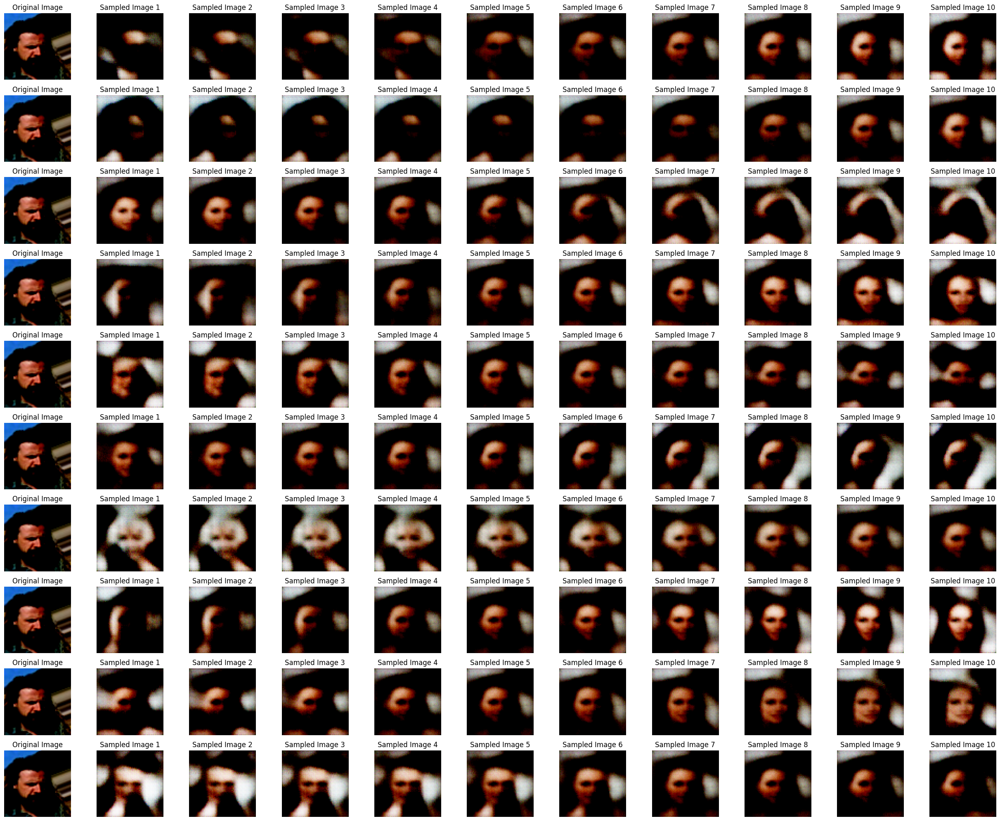

Beta: 1


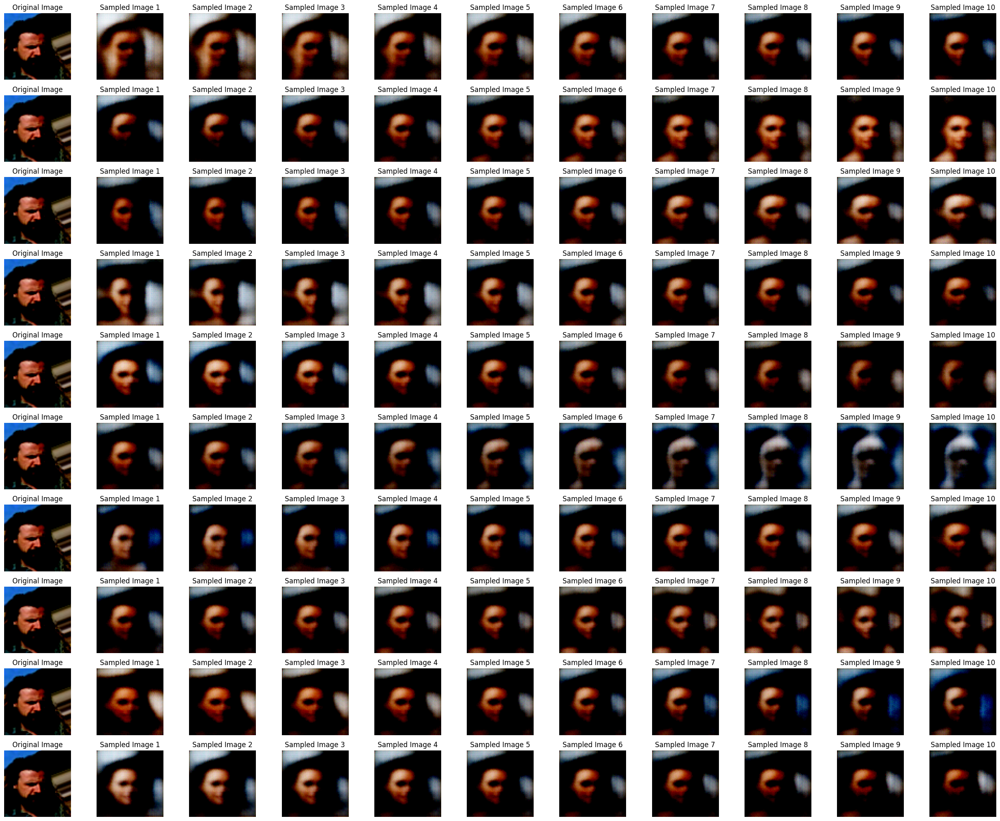

Beta: 5


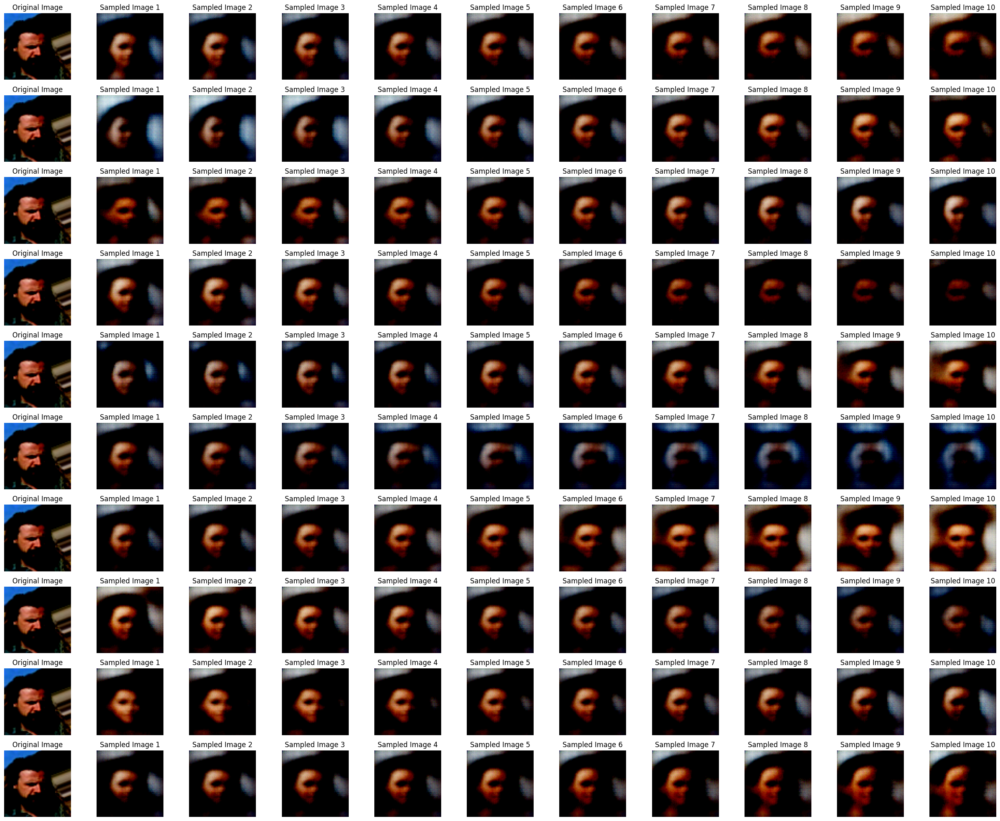

Beta: 10


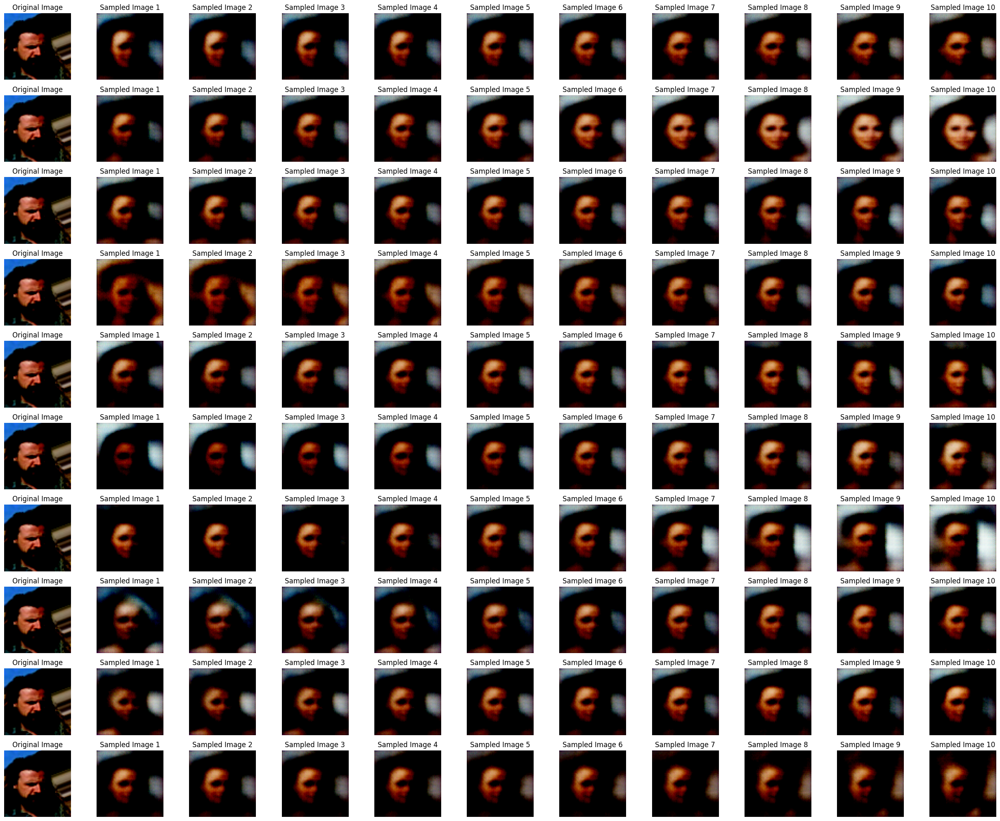

Beta: 50


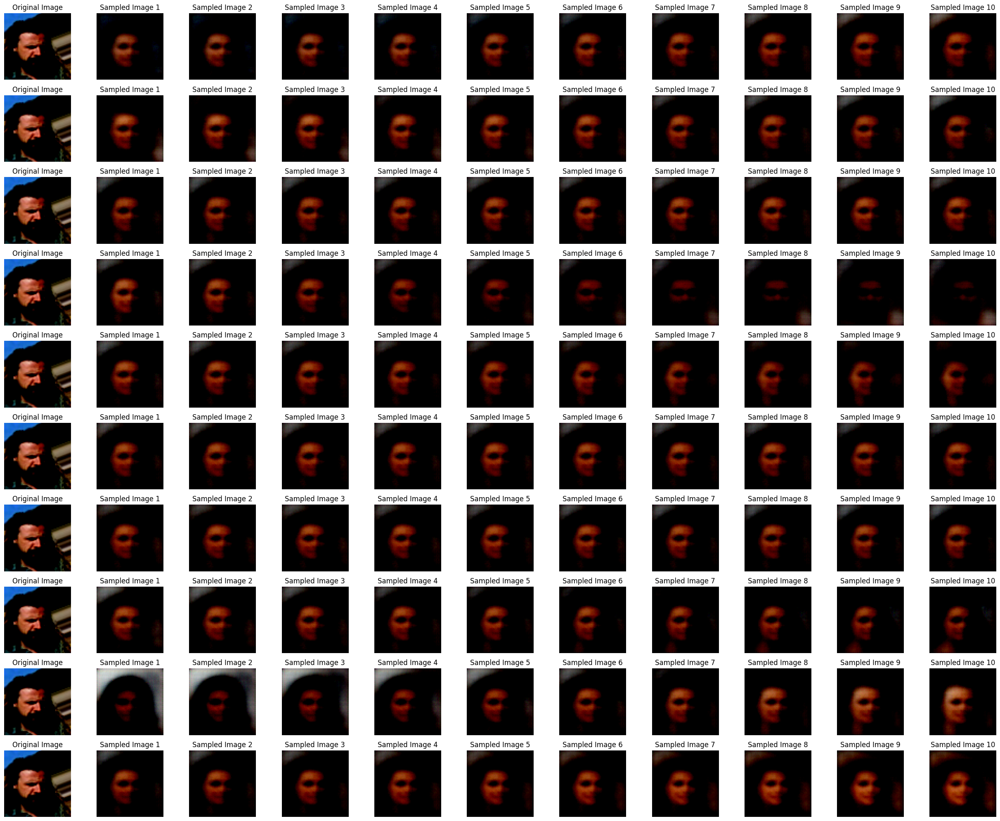

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Function to generate samples by varying each latent dimension
def visualize_all_latent_dimensions(model, input_image, num_samples=10, latent_dim=10, device='cpu', num_latent_dims=10):
    model.eval()

    # Step 1: Pass the image through the encoder to get the latent representation (mu, logvar)
    mu, logvar = model.encoder(input_image)

    # Choose a random sample of the latent vector (first image in the batch)
    latent_vector = mu[0].unsqueeze(0)  # Get the latent vector for the first image in the batch

    # Step 2: Initialize a figure with subplots
    fig, axes = plt.subplots(num_latent_dims, num_samples + 1, figsize=(25, 20))  # Include space for the original image

    # Step 3: Prepare the original image
    original_image = input_image[0].cpu().numpy().transpose(1, 2, 0)  # Assuming the image is in CHW format

    # Step 4: Loop through each latent dimension to vary it
    for dim_to_vary in range(num_latent_dims):
        # Display the original image in the first column of the current row
        axes[dim_to_vary, 0].imshow(np.clip(original_image, 0, 1))  # Clip for valid range [0, 1]
        axes[dim_to_vary, 0].axis('off')
        axes[dim_to_vary, 0].set_title("Original Image")  # Title for the first column

        # Set the range to vary based on the mean ± 2 * std
        latent_mean = latent_vector.mean().item()
        latent_std = latent_vector.std().item()
        range_min = latent_mean - 2 * latent_std
        range_max = latent_mean + 2 * latent_std

        # Create a grid of latent values for the dimension to vary
        latent_values = torch.linspace(range_min, range_max, steps=num_samples).to(device)

        # Generate and display samples for the current latent dimension
        for i, value in enumerate(latent_values):
            # Clone the latent vector and vary the current latent dimension
            varied_latent = latent_vector.clone().to(device)
            varied_latent[:, dim_to_vary] = value

            # Generate a sample using the decoder
            with torch.no_grad():
                generated_sample = model.decoder(varied_latent)

            # Convert the sample to an image format
            generated_image = generated_sample[0].cpu().numpy().transpose(1, 2, 0)  # CHW -> HWC
            axes[dim_to_vary, i + 1].imshow(np.clip(generated_image, 0, 1))  # Clip for valid range [0, 1]
            axes[dim_to_vary, i + 1].axis('off')
            axes[dim_to_vary, i + 1].set_title(f"Sampled Image {i + 1}")  # Title for generated samples

        # Set row label
        axes[dim_to_vary, 0].set_ylabel(f"Latent Dim {dim_to_vary}", rotation=90, fontsize=10)

    plt.tight_layout()
    plt.show()

# Example usage for all beta models
x, _ = next(iter(data_loader))  # Assuming data_loader provides batches of images
x = x.to(device)

# Loop through each beta model and visualize latent dimensions
for beta in beta_values:
    print(f"Beta: {beta}")
    visualize_all_latent_dimensions(
        trained_models[beta], x, num_samples=10, latent_dim=latent_dim, device=device, num_latent_dims=10
    )


---

# Disentanglement-Lib | Z-diff

In [19]:
""""""
from sklearn.metrics import mutual_info_score

def compute_mig(latent_vectors, ground_truth):
    num_latents = latent_vectors.shape[1]
    num_factors = ground_truth.shape[1]

    mutual_info = np.zeros((num_latents, num_factors))
    for i in range(num_latents):
        for j in range(num_factors):
            mutual_info[i, j] = mutual_info_score(
                latent_vectors[:, i].round(2), ground_truth[:, j].round(2)
            )
    
    mig = np.mean(np.max(mutual_info, axis=0) - np.partition(mutual_info, -2, axis=0)[-2])
    return mig

In [20]:
import warnings
import numpy as np
from tqdm import tqdm

# Suppress all warnings
warnings.filterwarnings("ignore")

MIG = {}
for beta in beta_values:
    BVAE = trained_models[beta].to(device)
    BVAE.eval()  # Set model to evaluation mode
    
    all_latent_reprs = []
    all_attributes = []
    
    with torch.no_grad():
        for images, attributes in tqdm(data_loader):
            images = images.to(device) 
            # Forward pass through the BetaVAE model
            _, mu, logvar = BVAE(images)
            z = BVAE.reparameterize(mu, logvar)  # Latent representation

            # Store latent representations and attributes
            all_latent_reprs.append(z.cpu().numpy())
            all_attributes.append(attributes.numpy())
    
    # Convert lists to numpy arrays
    latent_repr = np.concatenate(all_latent_reprs, axis=0)
    attributes = np.concatenate(all_attributes, axis=0)

    MIG[beta] = compute_mig(latent_repr, attributes)
    print(f'MIG score for Beta-VAE model with beta={beta}: {MIG[beta]}')


100%|██████████| 396/396 [02:26<00:00,  2.71it/s]


MIG score for Beta-VAE model with beta=0: 0.0019194243864775807


100%|██████████| 396/396 [02:22<00:00,  2.77it/s]


MIG score for Beta-VAE model with beta=1: 0.0016009752857385402


100%|██████████| 396/396 [02:24<00:00,  2.74it/s]


MIG score for Beta-VAE model with beta=5: 0.0023041789294413347


100%|██████████| 396/396 [02:24<00:00,  2.74it/s]


MIG score for Beta-VAE model with beta=10: 0.003845751413952154


100%|██████████| 396/396 [02:24<00:00,  2.74it/s]


MIG score for Beta-VAE model with beta=50: 0.003731070330185604


In [21]:
print(MIG)

{0: 0.0019194243864775807, 1: 0.0016009752857385402, 5: 0.0023041789294413347, 10: 0.003845751413952154, 50: 0.003731070330185604}


# Z-Diddy

In [ ]:
from sklearn.metrics.pairwise import pairwise_distances
from collections import Counter
from tqdm import tqdm

def compute_latents(model, data_loader, device):
    latents = []
    labels = []
    model.eval()
    with torch.no_grad():
        for data, label in data_loader:
            data = data.to(device)
            # Get the latent variables (mu, logvar) from the encoder
            mu, logvar = model.encoder(data)
            z = model.reparameterize(mu, logvar)
            latents.append(z.cpu().numpy())
            labels.append(label.cpu().numpy())
    latents = np.vstack(latents)
    labels = np.vstack(labels)
    return latents, labels

def z_diff_measure(model, data_loader, selected_attribute, device):
    # Compute latents and labels
    latents, labels = compute_latents(model, data_loader, device)
    
    # Get indices of the images where the selected attribute is the same
    same_attr_indices = np.where(labels[:, selected_attribute] == 1)[0]
    
    # Extract the latents corresponding to the selected attribute
    selected_latents = latents[same_attr_indices]
    
    # Compute pairwise distances between latents
    pairwise_dist = pairwise_distances(selected_latents, selected_latents)
    
    # Find the argmin of the pairwise differences
    np.fill_diagonal(pairwise_dist, np.inf)  # Ignore diagonal as it's the same image
    min_indices = np.argmin(pairwise_dist, axis=1)
    
    # Collect the predictions by taking the most common label among the closest pairs
    common_labels = []
    for i in range(len(min_indices)):
        closest_index = min_indices[i]
        common_label = labels[same_attr_indices[i]] == labels[same_attr_indices[closest_index]]
        common_labels.append(common_label)
    
    # Calculate accuracy (how often the closest pair shares the same attribute)
    accuracy = np.mean(common_labels)
    return accuracy

def compute_z_diff_for_all_models(trained_models, data_loader, selected_attribute, device):
    z_diff_results = {}
    
    for beta, model in tqdm(trained_models.items(), desc="Computing Z-Diff for all betas"):
        accuracy = z_diff_measure(model, data_loader, selected_attribute, device)
        z_diff_results[beta] = accuracy
    
    return z_diff_results


selected_attribute = 20  # This is the attribute you want to focus on

attribute_name = attribute_names[selected_attribute]
z_diff_accuracies = compute_z_diff_for_all_models(trained_models, data_loader, selected_attribute, device)

Computing Z-Diff for all betas:   0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
print("Attribute: ", attribute_name)
print(z_diff_accuracies)

In [ ]:
selected_attribute =20  # This is the attribute you want to focus on
attribute_name = attribute_names[selected_attribute]
print("Attribute: ", attribute_name)

---

In [ ]:
# Step 1: Select an attribute (e.g., 'Smiling' attribute index)
selected_attribute_index = 4  # Example: Index for 'Smiling' attribute
attribute_name = attribute_names[selected_attribute_index]
print("Attribute: ", attribute_name)


# Find all images where the selected attribute has the same value (e.g., 1 or 0)
attribute_value = 1  # You can change this to 0 to get images where the attribute is not present
selected_images = []

for image, label in data_loader:
    # Check the selected attribute for each image in the batch
    for i in range(len(label)):
        if label[i, selected_attribute_index] == attribute_value:
            selected_images.append(image[i])
    # if len(selected_images) >= 1000:
    #     break

print(f"Number of selected images with the attribute {selected_attribute_index} = {attribute_value}: {len(selected_images)}")

import torchvision.transforms as transforms

# Make sure selected_images contains at least 5 images
plot_images = selected_images[:5]  # Take the first 5 images

# Plot the images
fig, axes = plt.subplots(1, 5, figsize=(15, 5))  # Create a 1x5 grid for 5 images
for i, image in enumerate(plot_images):
    # Convert the image from tensor to numpy for display
    image = image.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C)
    image = image.numpy()  # Convert tensor to numpy array
    axes[i].imshow(image)
    axes[i].axis('off')  # Turn off axis

plt.show()



In [ ]:
selected_latents = {}

for beta in beta_values:
    beta_vae = trained_models[beta]
    
    # Convert the selected images into a tensor
    selected_images_tensor = torch.stack(selected_images)  # Shape: [num_selected_images, C, H, W]
    
    # Make sure the model is in evaluation mode
    beta_vae.eval()
    
    # Move the images to the correct device (GPU or CPU)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    selected_images_tensor = selected_images_tensor.to(device)
    
    # Pass the selected images through the encoder
    with torch.no_grad():
        mu, logvar = beta_vae.encoder(selected_images_tensor)
        latents = beta_vae.reparameterize(mu, logvar)
    
    # latents is a tensor of shape [num_selected_images, latent_dim]
    print(f"Latents shape: {latents.shape}")
    selected_latents[beta] = latents


In [ ]:
z_diffs = {}

for beta in beta_values:
    # Assuming latents is a tensor of shape [num_selected_images, latent_dim]
    latents = selected_latents[beta]
    num_latents = latents.shape[0]  # Get the latent dimension size
    latent_diffs = []
    
    # Loop through each pair of latents (i, j)
    for i in range(num_latents):
        for j in range(i, num_latents):
            # Compute the difference z[i] - z[j]
            z_diff = latents[i] - latents[j]  # Element-wise difference for each image
            latent_diffs.append(z_diff)
    
    # Convert the list of differences into a tensor (optional)
    latent_diffs = torch.stack(latent_diffs)
    
    # Now latent_diffs contains the pairwise differences for all pairs (i, j)
    print(f"Shape of latent_diffs: {latent_diffs.shape}")

    # Find the argmin for each latent difference (along the appropriate dimension)
    argmin_indices = torch.argmin(latent_diffs, dim=1)  # Find argmin along each row
    
    # Print the argmin indices
    print(f"Argmin indices shape for latent differences: {argmin_indices.shape}")

    total_preds = argmin_indices.shape[0]
    print(f"Total preds: {total_preds}")

    # Find the most common value in argmin_indices using bincount
    bincount = torch.bincount(argmin_indices)
    
    # Find the value with the maximum count (i.e., the most common value)
    most_common_value = torch.argmax(bincount).item()
    
    # Find the count of the most common value
    count_most_common_value = bincount[most_common_value].item()
    
    # Print the most common value and its count
    print(f"Most common value: {most_common_value}, Count: {count_most_common_value}")

    z_diff = count_most_common_value / total_preds
    print(f"Z-Diddy Accuracy: {z_diff}\n")
    z_d[beta] = z_diff


In [ ]:
from pprint import pprint
pprint(z_diddy)